Processing examples:   0%|          | 0/200 [00:00<?, ?it/s]

Processing examples: 100%|██████████| 200/200 [01:15<00:00,  2.63it/s]


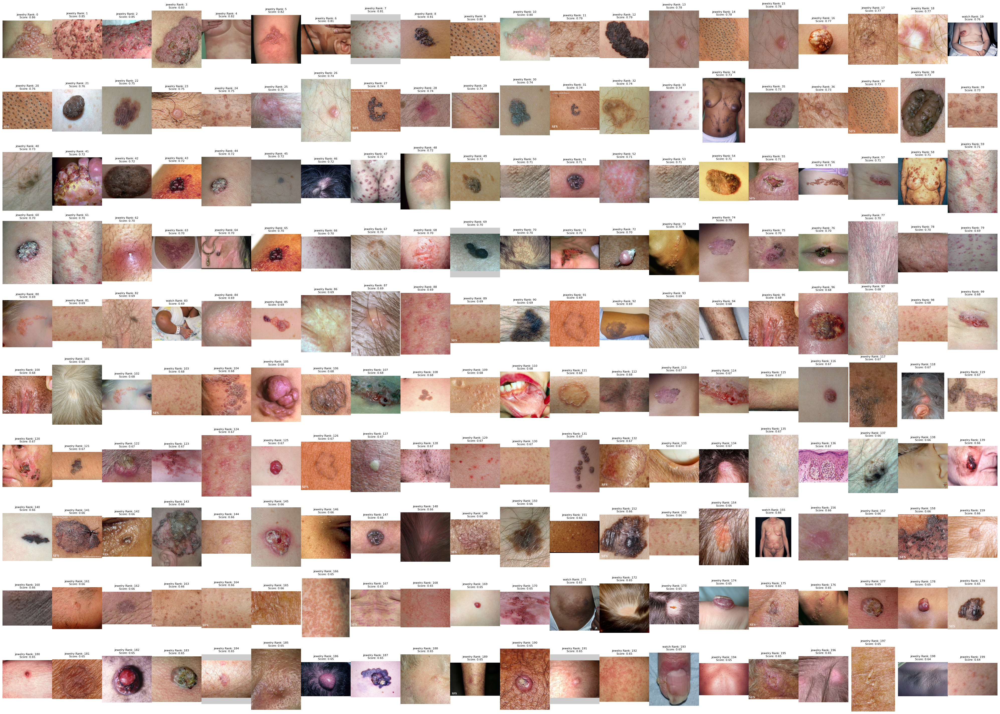

In [ ]:
# Plot the DINO scores for artifact across all images using <list.txt> which was generated by artifact_detection.py running on Ubuntu with GPU.

import torchvision.transforms as T
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import numpy as np
from PIL import Image
from tqdm import tqdm
import re
import os

size = 224
transform = T.Resize(size=size, interpolation=T.InterpolationMode.BICUBIC)


def example_plot(
    path_list,
    scores,
    object_list,
    desc=True,
    num_example=200,
    num_column=20,
):

    fig = plt.figure(
        figsize=(
            num_column * 2,
            1.3 * (num_example // num_column + 1) * 2,
        ),
        facecolor="white",
    )

    main_gs = gridspec.GridSpec(1, 1, figure=fig)

    nested_gs = gridspec.GridSpecFromSubplotSpec(
        num_example // num_column + (1 if num_example % num_column > 0 else 0),
        num_column,
        subplot_spec=main_gs[0],
        wspace=0,
        hspace=0.1,
        width_ratios=[1] * num_column,
    )

    axd = dict()

    for rank_num in tqdm(range(num_example), desc="Processing examples"):
        ax = fig.add_subplot(nested_gs[rank_num])

        if desc:
            sorted_score_idx = np.argsort(scores)[::-1]
        else:
            sorted_score_idx = np.argsort(scores)
        image_path = path_list[sorted_score_idx[rank_num]]
        image = Image.open(image_path)
        ax.imshow(transform(image))
        ax.axis("off")

        plot_key = rank_num
        axd[plot_key] = ax

        axd[plot_key].set_title(
            f"{object_list[sorted_score_idx[rank_num]]} Rank: {rank_num}\nScore: {scores[sorted_score_idx[rank_num]]:.2f}",
            fontsize=8,
        )

        plt.tight_layout()

        # plt.suptitle(f"{suptitle}", fontsize=16, fontweight="bold", y=1.005)
        plt.show()


path_list = list()
object_list = list()
logits_list = list()

pattern = r"logits:\s*tensor\(\[([0-9.-]+)\]\)"

with open("list.txt", "r") as f:
    for line_num, line in enumerate(f):
        i = line_num % 4
        match i:
            case 0:
                file_name = line.strip().split("/")[-1]
                path_list.append(
                    os.path.abspath(
                        (
                            os.path.join(
                                os.getcwd(), "data", "Fitzpatric_subset", file_name
                            )
                        )
                    )
                )
                # print(path_list[-1])
            case 1:
                continue
            case 2:
                object_list.append(line.strip())
            case 3:
                match = re.search(pattern, line)
                if match:
                    logits = float(match.group(1))
                    logits_list.append(logits)

example_plot(
    path_list=path_list,
    scores=logits_list,
    object_list=object_list,
    desc=True,
    num_example=200,
    num_column=20,
)